
LAZY SNAPPING AND K-MEANS SEGMENATION FOR MONO LISA


           * Original Image Comparison (k=2, 4, 8, 16):
                This grid of images displays the original input image alongside its segmented counterparts obtained through Lazy Snapping and K-Means algorithms. The varying values of k offer insights into how different cluster numbers impact segmentation quality.

            * Lazy Snapping Segmented Image:
                Utilizing seed pixels from user-defined foreground and background masks, Lazy Snapping computes pixel likelihoods for foreground or background classification. The resulting segmentation demonstrates pixel-wise classification based on these likelihoods.

            * K-Means Segmented Image: 
                Employing the K-Means algorithm, this segmentation partitions the image into k clusters based on pixel intensity similarities. Each cluster is represented by its centroid, providing a straightforward yet effective means of image segmentation.

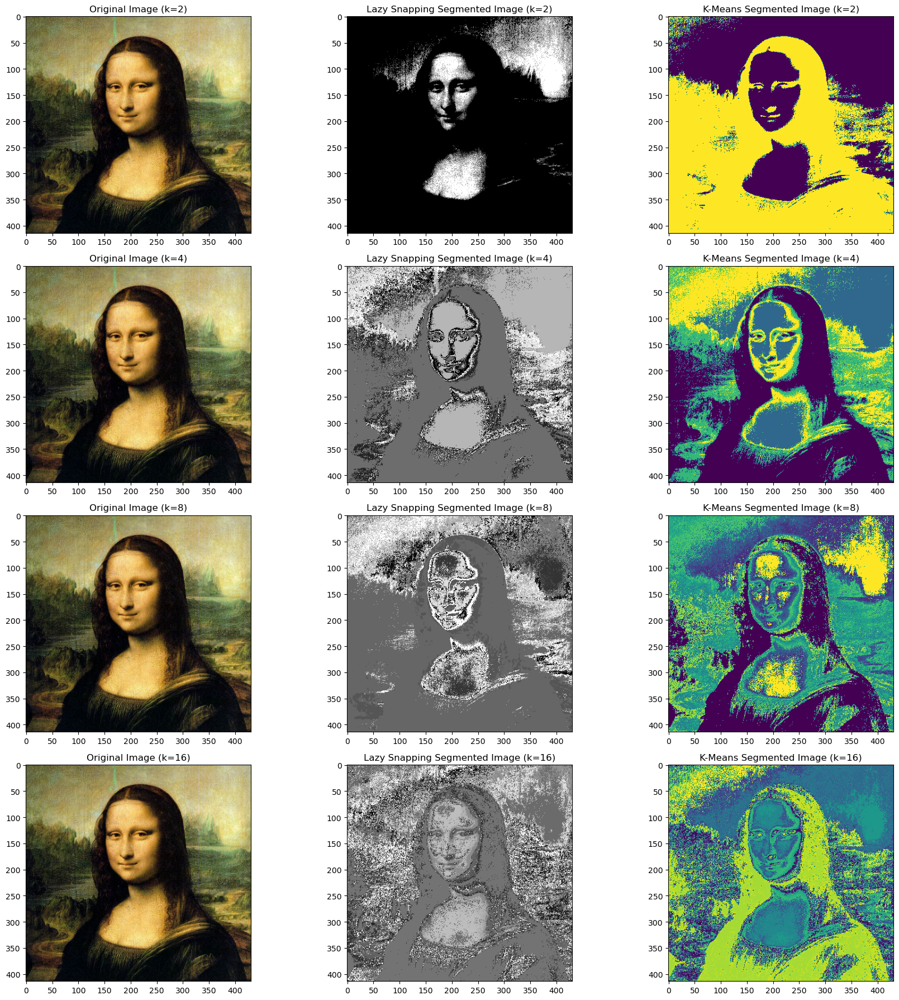

In [16]:
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Implement K-Means Clustering
def kmeans_clustering(data, k, max_iter=100):
    centroids = data[np.random.choice(len(data), k, replace=False)]
    for _ in range(max_iter):
        # Assign each data point to the nearest centroid
        labels = np.argmin(np.linalg.norm(data[:, None] - centroids, axis=2), axis=1)
        # Update centroids based on the mean of the data points assigned to each centroid
        new_centroids = np.array([data[labels == i].mean(axis=0) for i in range(k)])
        # Check for convergence
        if np.all(centroids == new_centroids):
            break
        centroids = new_centroids
    return labels, centroids

# Step 2: Extract seed pixels for foreground and background
def extract_seeds(image, foreground_mask, background_mask, k):
    foreground_indices = np.transpose(np.nonzero(foreground_mask))
    background_indices = np.transpose(np.nonzero(background_mask))
    
    if len(foreground_indices) < k or len(background_indices) < k:
        raise ValueError("Number of foreground or background pixels is less than k.")
    
    foreground_indices_sampled = foreground_indices[np.random.choice(len(foreground_indices), k, replace=False)]
    background_indices_sampled = background_indices[np.random.choice(len(background_indices), k, replace=False)]
    
    foreground_seeds = image[foreground_indices_sampled[:, 0], foreground_indices_sampled[:, 1]]
    background_seeds = image[background_indices_sampled[:, 0], background_indices_sampled[:, 1]]
    
    return foreground_seeds, background_seeds

# Step 3: Compute likelihood of each pixel belonging to each class
def compute_likelihood(image, seeds, k, wk=0.1):
    h, w, _ = image.shape
    likelihood = np.zeros((h, w, k))
    for i, seed in enumerate(seeds):
        # Reshape seed to match image shape
        seed_reshaped = np.tile(seed, (h, w, 1))
        # Compute Euclidean distance
        distance = np.linalg.norm(image - seed_reshaped, axis=2)
        likelihood[:, :, i] = np.exp(-distance * wk)
    # Normalize likelihood
    likelihood /= likelihood.sum(axis=2)[:, :, np.newaxis]
    return likelihood

# Step 4: Assign pixels to foreground or background based on likelihood
def lazy_snapping(image, likelihood):
    segmented_image = np.argmax(likelihood, axis=2)
    return segmented_image

# Main function for Lazy Snapping segmentation
def lazy_snapping_segmentation(image, foreground_mask, background_mask, k=64, wk=0.1):
    # Step 1: Extract seed pixels for foreground and background
    foreground_seeds, background_seeds = extract_seeds(image, foreground_mask, background_mask, k)
    
    # Step 2: Compute likelihood of each pixel belonging to each class
    seeds = np.vstack((foreground_seeds, background_seeds))
    likelihood = compute_likelihood(image, seeds, len(seeds), wk)
    
    # Step 3: Assign pixels to foreground or background based on likelihood
    segmented_image = lazy_snapping(image, likelihood)
    
    return segmented_image

# Function for K-Means segmentation
def kmeans_segmentation(image, k):
    h, w, _ = image.shape
    reshaped_image = np.reshape(image, (h * w, -1))
    
    # Perform K-Means clustering on entire image
    labels, _ = kmeans_clustering(reshaped_image, k)
    
    # Reshape labels back to image shape
    segmented_image = labels.reshape((h, w))
    
    return segmented_image

image = plt.imread(r"C:\Users\Dell\AppData\Local\Temp\ae1decac-0ff7-4cfd-a04f-221ca564f3f4_Data.zip.3f4\Q1 Dataset\Mona-lisa.PNG" )  # Load your image
foreground_mask = plt.imread(r"C:\Users\Dell\AppData\Local\Temp\e871c639-84b6-4640-8300-0eab059418ed_Data.zip.8ed\Q1 Dataset\Mona-lisa stroke 1.png")
background_mask = plt.imread(r"C:\Users\Dell\AppData\Local\Temp\e1578301-bec6-4c64-b929-971c70a7089c_Data.zip.89c\Q1 Dataset\Mona-lisa stroke 2.png")
# Different values of k
ks = [2, 4, 8, 16]

# Create a grid of images
plt.figure(figsize=(18, 18))

for i, k_value in enumerate(ks):
    try:
        lazy_snapping_segmented_image = lazy_snapping_segmentation(image, foreground_mask, background_mask, k=k_value)
        kmeans_segmented_image = kmeans_segmentation(image, k=k_value)

        # Plot original image
        plt.subplot(4, 3, i*3 + 1)
        plt.imshow(image)
        plt.title(f'Original Image (k={k_value})')

        # Plot Lazy Snapping segmented image
        plt.subplot(4, 3, i*3 + 2)
        plt.imshow(lazy_snapping_segmented_image, cmap='gray')
        plt.title(f'Lazy Snapping Segmented Image (k={k_value})')

        # Plot K-Means segmented image
        plt.subplot(4, 3, i*3 + 3)
        plt.imshow(kmeans_segmented_image )
        plt.title(f'K-Means Segmented Image (k={k_value})')
    except ValueError as e:
        print(f"Skipping k={k_value}: {e}")

plt.tight_layout()
plt.show()


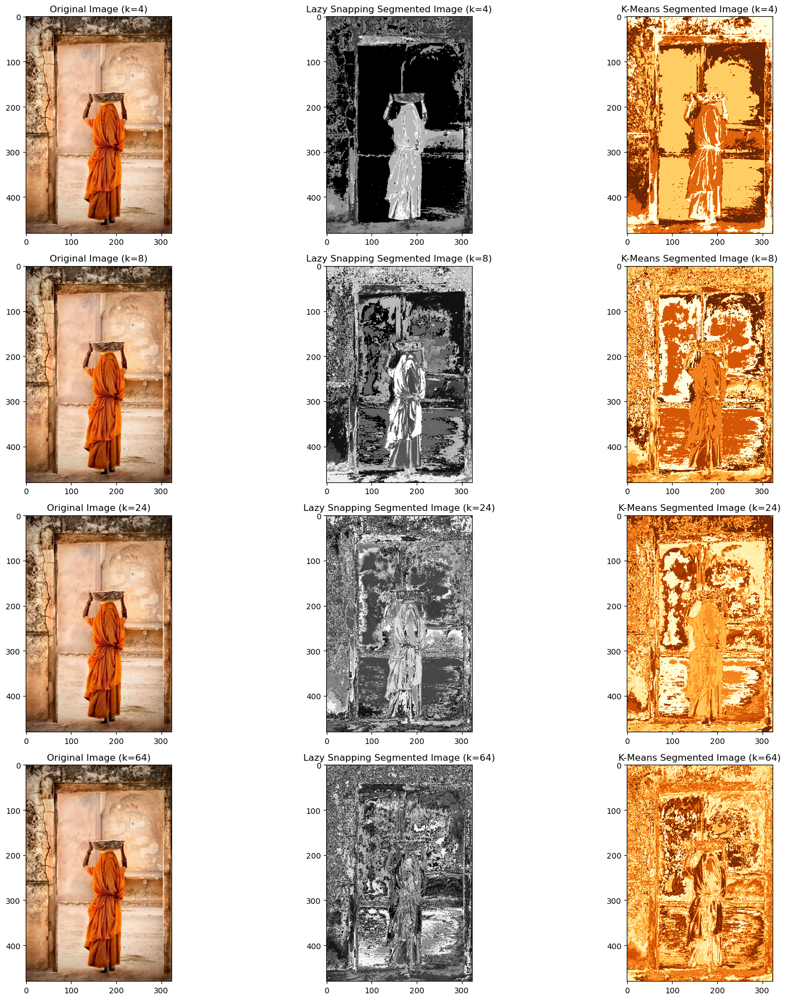

In [31]:
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Implement K-Means Clustering
def kmeans_clustering(data, k, max_iter=100):
    centroids = data[np.random.choice(len(data), k, replace=False)]
    for _ in range(max_iter):
        # Assign each data point to the nearest centroid
        labels = np.argmin(np.linalg.norm(data[:, None] - centroids, axis=2), axis=1)
        # Update centroids based on the mean of the data points assigned to each centroid
        new_centroids = np.array([data[labels == i].mean(axis=0) for i in range(k)])
        # Check for convergence
        if np.all(centroids == new_centroids):
            break
        centroids = new_centroids
    return labels, centroids

# Step 2: Extract seed pixels for foreground and background
def extract_seeds(image, foreground_mask, background_mask, k):
    foreground_indices = np.transpose(np.nonzero(foreground_mask))
    background_indices = np.transpose(np.nonzero(background_mask))
    
    if len(foreground_indices) < k or len(background_indices) < k:
        raise ValueError("Number of foreground or background pixels is less than k.")
    
    foreground_indices_sampled = foreground_indices[np.random.choice(len(foreground_indices), k, replace=False)]
    background_indices_sampled = background_indices[np.random.choice(len(background_indices), k, replace=False)]
    
    foreground_seeds = image[foreground_indices_sampled[:, 0], foreground_indices_sampled[:, 1]]
    background_seeds = image[background_indices_sampled[:, 0], background_indices_sampled[:, 1]]
    
    return foreground_seeds, background_seeds

# Step 3: Compute likelihood of each pixel belonging to each class
def compute_likelihood(image, seeds, k, wk=0.1):
    h, w, _ = image.shape
    likelihood = np.zeros((h, w, k))
    for i, seed in enumerate(seeds):
        # Reshape seed to match image shape
        seed_reshaped = np.tile(seed, (h, w, 1))
        # Compute Euclidean distance
        distance = np.linalg.norm(image - seed_reshaped, axis=2)
        likelihood[:, :, i] = np.exp(-distance * wk)
    # Normalize likelihood
    likelihood /= likelihood.sum(axis=2)[:, :, np.newaxis]
    return likelihood

# Step 4: Assign pixels to foreground or background based on likelihood
def lazy_snapping(image, likelihood):
    segmented_image = np.argmax(likelihood, axis=2)
    return segmented_image

# Main function for Lazy Snapping segmentation
def lazy_snapping_segmentation(image, foreground_mask, background_mask, k=64, wk=0.1):
    # Step 1: Extract seed pixels for foreground and background
    foreground_seeds, background_seeds = extract_seeds(image, foreground_mask, background_mask, k)
    
    # Step 2: Compute likelihood of each pixel belonging to each class
    seeds = np.vstack((foreground_seeds, background_seeds))
    likelihood = compute_likelihood(image, seeds, len(seeds), wk)
    
    # Step 3: Assign pixels to foreground or background based on likelihood
    segmented_image = lazy_snapping(image, likelihood)
    
    return segmented_image

# Function for K-Means segmentation
def kmeans_segmentation(image, k):
    h, w, _ = image.shape
    reshaped_image = np.reshape(image, (h * w, -1))
    
    # Perform K-Means clustering on entire image
    labels, _ = kmeans_clustering(reshaped_image, k)
    
    # Reshape labels back to image shape
    segmented_image = labels.reshape((h, w))
    
    return segmented_image

image = plt.imread(r"C:\Users\Dell\Downloads\Data\Q1 Dataset\lady.PNG" )  # Load your image
foreground_mask = plt.imread(r"C:\Users\Dell\Downloads\Data\Q1 Dataset\lady stroke 1.png")
background_mask = plt.imread(r"C:\Users\Dell\Downloads\Data\Q1 Dataset\lady stroke 2.png")
# Different values of k
ks = [4, 8 ,24 ,64]

# Create a grid of images
plt.figure(figsize=(18, 18))

for i, k_value in enumerate(ks):
    try:
        lazy_snapping_segmented_image = lazy_snapping_segmentation(image, foreground_mask, background_mask, k=k_value)
        kmeans_segmented_image = kmeans_segmentation(image, k=k_value)

        # Plot original image
        plt.subplot(4, 3, i*3 + 1)
        plt.imshow(image)
        plt.title(f'Original Image (k={k_value})')

        # Plot Lazy Snapping segmented image
        plt.subplot(4, 3, i*3 + 2)
        plt.imshow(lazy_snapping_segmented_image, cmap='gray')
        plt.title(f'Lazy Snapping Segmented Image (k={k_value})')

        # Plot K-Means segmented image
        plt.subplot(4, 3, i*3 + 3)
        plt.imshow(kmeans_segmented_image , cmap = 'YlOrBr')
        plt.title(f'K-Means Segmented Image (k={k_value})')
    except ValueError as e:
        print(f"Skipping k={k_value}: {e}")

plt.tight_layout()
plt.show()


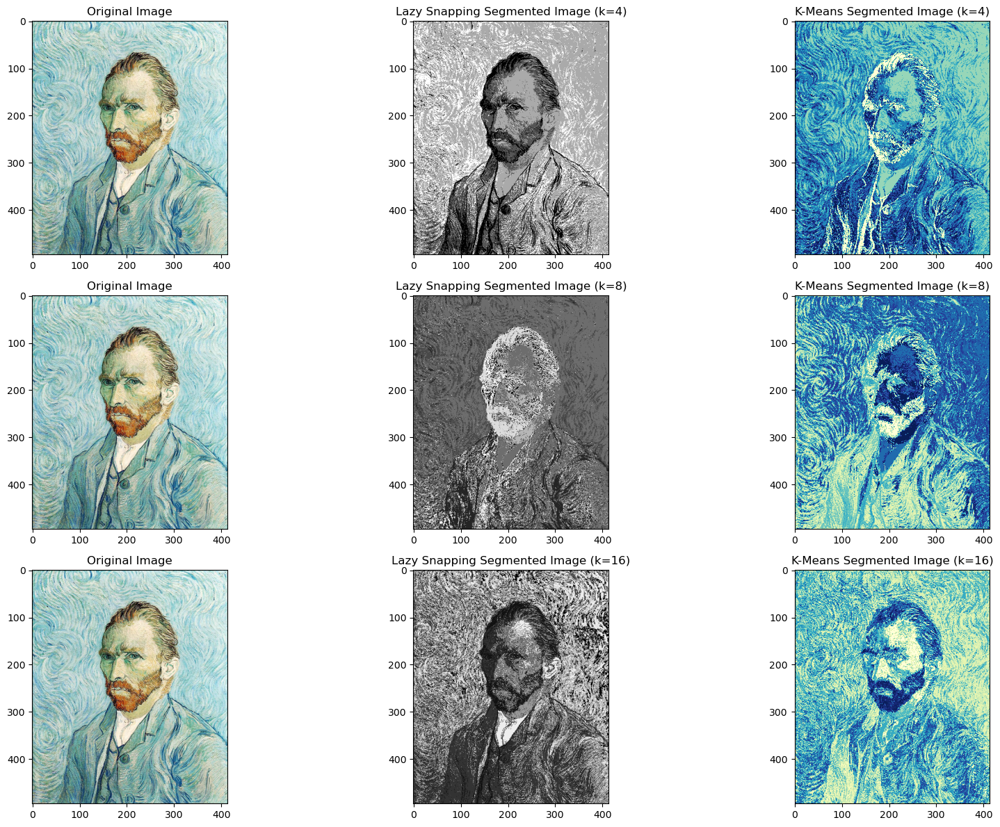

In [35]:
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Implement K-Means Clustering
def kmeans_clustering(data, k, max_iter=100):
    centroids = data[np.random.choice(len(data), k, replace=False)]
    for _ in range(max_iter):
        # Assign each data point to the nearest centroid
        labels = np.argmin(np.linalg.norm(data[:, None] - centroids, axis=2), axis=1)
        # Update centroids based on the mean of the data points assigned to each centroid
        new_centroids = np.array([data[labels == i].mean(axis=0) for i in range(k)])
        # Check for convergence
        if np.all(centroids == new_centroids):
            break
        centroids = new_centroids
    return labels, centroids

# Step 2: Extract seed pixels for foreground and background
def extract_seeds(image, foreground_mask, k):
    foreground_indices = np.transpose(np.nonzero(foreground_mask))
    
    if len(foreground_indices) < k:
        raise ValueError("Number of foreground pixels is less than k.")
    
    foreground_indices_sampled = foreground_indices[np.random.choice(len(foreground_indices), k, replace=False)]
    
    foreground_seeds = image[foreground_indices_sampled[:, 0], foreground_indices_sampled[:, 1]]
    
    return foreground_seeds

# Step 3: Compute likelihood of each pixel belonging to each class
def compute_likelihood(image, seeds, k, wk=0.1):
    h, w, _ = image.shape
    likelihood = np.zeros((h, w, k))
    for i, seed in enumerate(seeds):
        # Reshape seed to match image shape
        seed_reshaped = np.tile(seed, (h, w, 1))
        # Compute Euclidean distance
        distance = np.linalg.norm(image - seed_reshaped, axis=2)
        likelihood[:, :, i] = np.exp(-distance * wk)
    # Normalize likelihood
    likelihood /= likelihood.sum(axis=2)[:, :, np.newaxis]
    return likelihood

# Step 4: Assign pixels to foreground or background based on likelihood
def lazy_snapping(image, likelihood):
    segmented_image = np.argmax(likelihood, axis=2)
    return segmented_image

# Main function for Lazy Snapping segmentation
def lazy_snapping_segmentation(image, foreground_mask, k=64, wk=0.1):
    # Step 1: Extract seed pixels for foreground
    foreground_seeds = extract_seeds(image, foreground_mask, k)
    
    # Step 2: Compute likelihood of each pixel belonging to each class
    likelihood = compute_likelihood(image, foreground_seeds, len(foreground_seeds), wk)
    
    # Step 3: Assign pixels to foreground or background based on likelihood
    segmented_image = lazy_snapping(image, likelihood)
    
    return segmented_image

# Function for K-Means segmentation
def kmeans_segmentation(image, k):
    h, w, _ = image.shape
    reshaped_image = np.reshape(image, (h * w, -1))
    
    # Perform K-Means clustering on entire image
    labels, _ = kmeans_clustering(reshaped_image, k)
    
    # Reshape labels back to image shape
    segmented_image = labels.reshape((h, w))
    
    return segmented_image

image = plt.imread(r"C:\Users\Dell\Downloads\Data\Q1 Dataset\van Gogh.PNG") 
foreground_mask = plt.imread(r"C:\Users\Dell\Downloads\Data\Q1 Dataset\van Gogh stroke.png") 
# Different values of k
ks = [4, 8, 16]

# Create a grid of images
plt.figure(figsize=(18, 12))

for i, k_value in enumerate(ks):
    try:
        lazy_snapping_segmented_image = lazy_snapping_segmentation(image, foreground_mask, k=k_value)
        kmeans_segmented_image = kmeans_segmentation(image, k=k_value)

        # Plot original image
        plt.subplot(3, 3, i*3 + 1)
        plt.imshow(image)
        plt.title('Original Image')

        # Plot Lazy Snapping segmented image
        plt.subplot(3, 3, i*3 + 2)
        plt.imshow(lazy_snapping_segmented_image, cmap='gray')
        plt.title(f'Lazy Snapping Segmented Image (k={k_value})')

        # Plot K-Means segmented image
        plt.subplot(3, 3, i*3 + 3)
        plt.imshow(kmeans_segmented_image , cmap = 'YlGnBu')
        plt.title(f'K-Means Segmented Image (k={k_value})')
    except ValueError as e:
        print(f"Skipping k={k_value}: {e}")

plt.tight_layout()
plt.show()
